In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

import seaborn as sns

In [2]:
df_o = pd.read_csv("Data/churn-bigml-80.csv")
print(df_o.shape)
df_o.head(10)

(2666, 20)


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
5,AL,118,510,Yes,No,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,False
6,MA,121,510,No,Yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False
7,MO,147,415,Yes,No,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False
8,WV,141,415,Yes,Yes,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False
9,RI,74,415,No,No,0,187.7,127,31.91,163.4,148,13.89,196.0,94,8.82,9.1,5,2.46,0,False


In [3]:
df_o.dtypes

State                      object
Account length              int64
Area code                   int64
International plan         object
Voice mail plan            object
Number vmail messages       int64
Total day minutes         float64
Total day calls             int64
Total day charge          float64
Total eve minutes         float64
Total eve calls             int64
Total eve charge          float64
Total night minutes       float64
Total night calls           int64
Total night charge        float64
Total intl minutes        float64
Total intl calls            int64
Total intl charge         float64
Customer service calls      int64
Churn                        bool
dtype: object

# Cleaned Orange Dataset

First validation checks on the orange dataset:
- no na's present in the dataset
- besides the state, voice mail plan and international plan the columns are numeric
- 2666 rows with 20 fatures
- 388 customers churned, which leaves 2278 out of the 2666 which didn't churn

In [4]:
for col_o in df_o.columns:
    unique_values_o=len(df_o[col_o].unique())
    print("unique values in col",col_o,":",unique_values_o)
    if(unique_values_o<10):
        print ("values",df_o[col_o].unique())

unique values in col State : 51
unique values in col Account length : 205
unique values in col Area code : 3
values [415 408 510]
unique values in col International plan : 2
values ['No' 'Yes']
unique values in col Voice mail plan : 2
values ['Yes' 'No']
unique values in col Number vmail messages : 42
unique values in col Total day minutes : 1489
unique values in col Total day calls : 115
unique values in col Total day charge : 1489
unique values in col Total eve minutes : 1442
unique values in col Total eve calls : 120
unique values in col Total eve charge : 1301
unique values in col Total night minutes : 1444
unique values in col Total night calls : 118
unique values in col Total night charge : 885
unique values in col Total intl minutes : 158
unique values in col Total intl calls : 21
unique values in col Total intl charge : 158
unique values in col Customer service calls : 10
unique values in col Churn : 2
values [False  True]


In [6]:
#check class balance for churn:
df_o[df_o['Churn']==True].shape

(388, 20)

<AxesSubplot:>

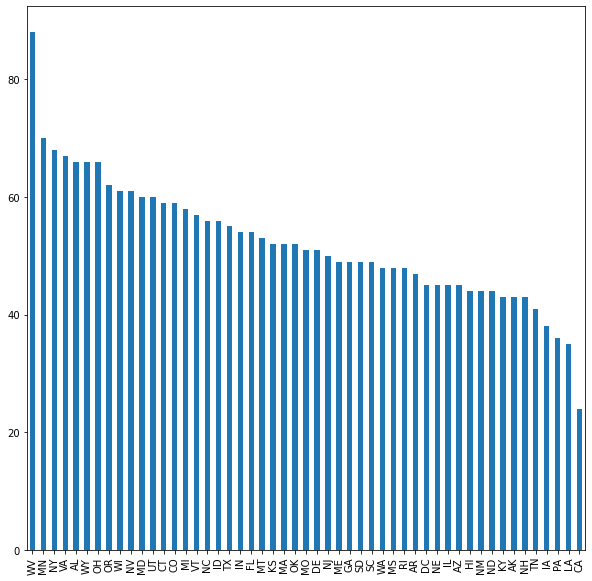

In [5]:
fig = plt.figure(figsize=(10,10))
df_o['State'].value_counts().plot(kind='bar')

# Telecom Provider Customer Churn Prediction 2020

First dataset exploration:
- 4250 customers, each with 20 features
- no na's present
- mainly numeric features, area code is setup as categorical data, same for international plan and voice mail plan, state
- 598 customers which churned, leaves 3652 which didn't (we might want to balance that dataset in later processing)
- no distribution shows large outlier
- based on the pairplots as well as the correlations it is evident that total_charge and total_minutes features are 100 % correlated (seems we have no upper limit of charge per day e.g.). Thus only one of those class of variables will be used from thereon.
- there is also (not too surprisingly) a high correlation observed between having vmail subscription and the number of voice mail messages. Thus use the number of voice mail messages as proxy.

In [6]:
df = pd.read_csv("Data/Telco2020/train.csv")
print(df.shape)
df.head(10)

(4250, 20)


,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no
5,MO,147,area_code_415,yes,no,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,no
6,LA,117,area_code_408,no,no,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,no
7,WV,141,area_code_415,yes,yes,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,no
8,IN,65,area_code_415,no,no,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,yes
9,RI,74,area_code_415,no,no,0,187.7,127,31.91,163.4,148,13.89,196.0,94,8.82,9.1,5,2.46,0,no


In [7]:
for col in df.columns:
    unique_values=len(df[col].unique())
    print("unique values in col",col,":",unique_values)
    if(unique_values<10):
        print ("values",df[col].unique())
        
#remark: area code 415: SF County, 510: East Bay & Oakland, 408: Coastal California, San Jose, aka all CA based

unique values in col state : 51
unique values in col account_length : 215
unique values in col area_code : 3
values ['area_code_415' 'area_code_408' 'area_code_510']
unique values in col international_plan : 2
values ['no' 'yes']
unique values in col voice_mail_plan : 2
values ['yes' 'no']
unique values in col number_vmail_messages : 46
unique values in col total_day_minutes : 1843
unique values in col total_day_calls : 120
unique values in col total_day_charge : 1843
unique values in col total_eve_minutes : 1773
unique values in col total_eve_calls : 123
unique values in col total_eve_charge : 1572
unique values in col total_night_minutes : 1757
unique values in col total_night_calls : 128
unique values in col total_night_charge : 992
unique values in col total_intl_minutes : 168
unique values in col total_intl_calls : 21
unique values in col total_intl_charge : 168
unique values in col number_customer_service_calls : 10
unique values in col churn : 2
values ['no' 'yes']


In [10]:
df[df['churn']=="yes"].shape

(598, 20)

In [8]:
#replaced catgorial values for international and voice mail plan
if (len(df[df['international_plan']=='yes']['international_plan'])>0 or len(df[df['international_plan']=='no']['international_plan'])>0):
    df=df.replace({'international_plan': {"no": 0, "yes": 1}})
if (len(df[df['voice_mail_plan']=='yes']['voice_mail_plan'])>0 or len(df[df['voice_mail_plan']=='no']['voice_mail_plan'])>0):
    df=df.replace({'voice_mail_plan': {"no": 0, "yes": 1}})
if (len(df[df['churn']=='yes']['churn'])>0 or len(df[df['churn']=='no']['churn'])>0):
    df=df.replace({'churn': {"no": 0, "yes": 1}})
for col in df.columns:
    unique_values=len(df[col].unique())
    print("unique values in col",col,":",unique_values)
    if(unique_values<10):
        print ("values",df[col].unique())

unique values in col state : 51
unique values in col account_length : 215
unique values in col area_code : 3
values ['area_code_415' 'area_code_408' 'area_code_510']
unique values in col international_plan : 2
values [0 1]
unique values in col voice_mail_plan : 2
values [1 0]
unique values in col number_vmail_messages : 46
unique values in col total_day_minutes : 1843
unique values in col total_day_calls : 120
unique values in col total_day_charge : 1843
unique values in col total_eve_minutes : 1773
unique values in col total_eve_calls : 123
unique values in col total_eve_charge : 1572
unique values in col total_night_minutes : 1757
unique values in col total_night_calls : 128
unique values in col total_night_charge : 992
unique values in col total_intl_minutes : 168
unique values in col total_intl_calls : 21
unique values in col total_intl_charge : 168
unique values in col number_customer_service_calls : 10
unique values in col churn : 2
values [0 1]


In [9]:
df.dtypes

state                             object
account_length                     int64
area_code                         object
international_plan                 int64
voice_mail_plan                    int64
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                              int64
dtype: object

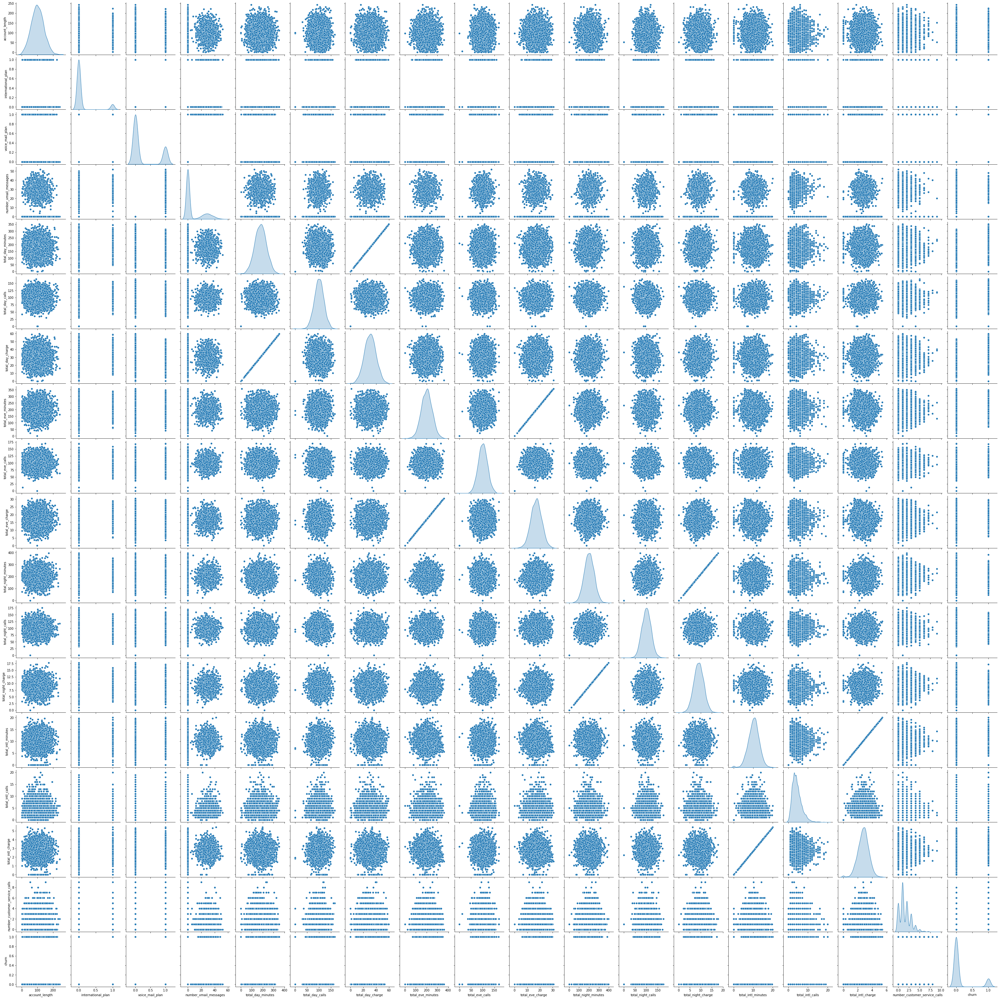

In [19]:
sns.pairplot(df,diag_kind="kde")

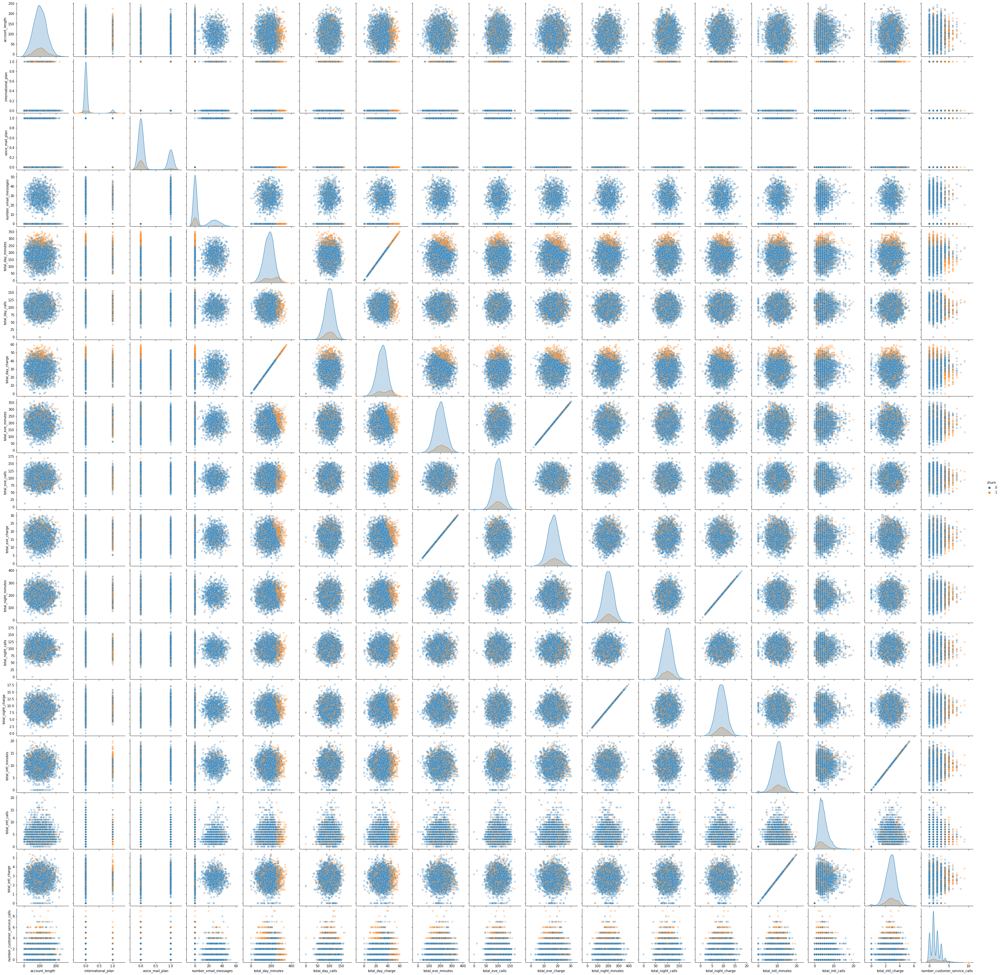

In [25]:
sns.pairplot(df,hue="churn",diag_kind="kde", plot_kws={'alpha': 0.3})

<AxesSubplot:>

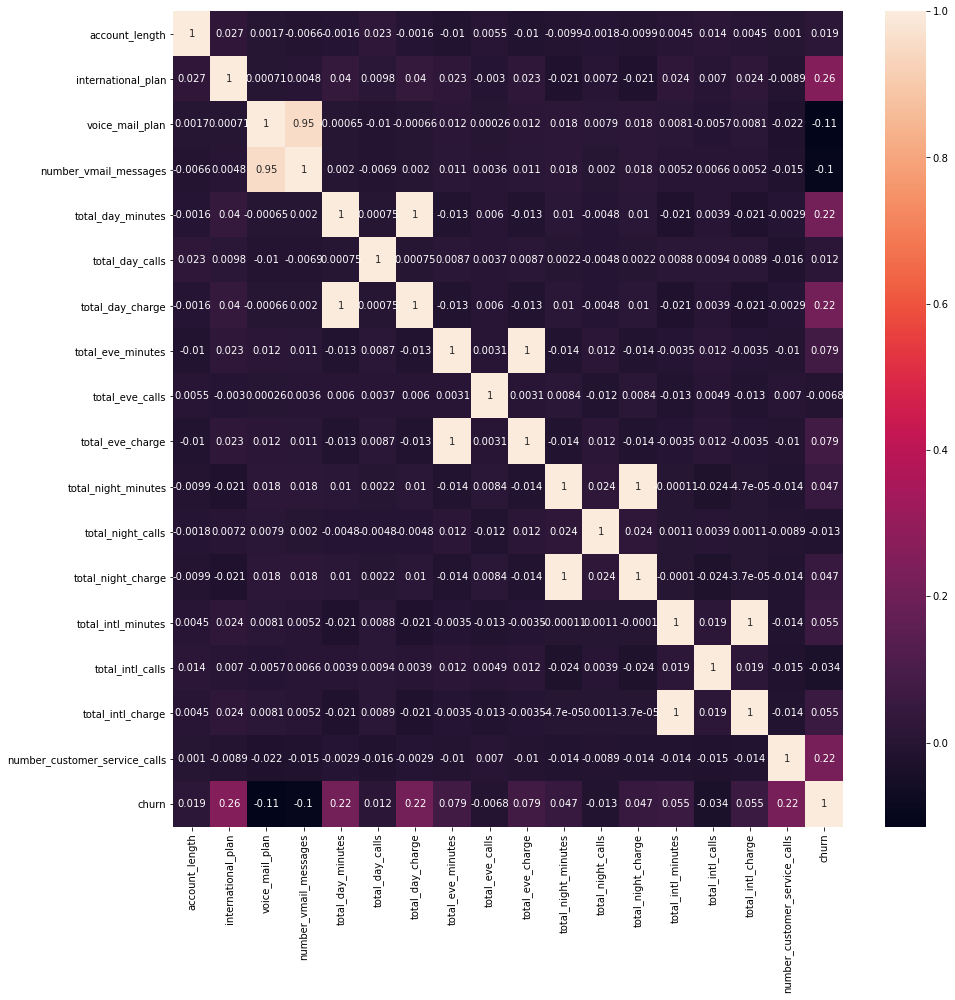

In [13]:
fig = plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)

Checked just out of curiosity the distribution by state, I was surprised to find West Virginia as leading state, California is in fact the one with least customers, so definitely my first guess of most customers per most populous state is not reflected in the distribution. Both datasets are definitely related, just looking at the distributions of the state shapewise, work on the larger dataset of the two for now.

<AxesSubplot:>

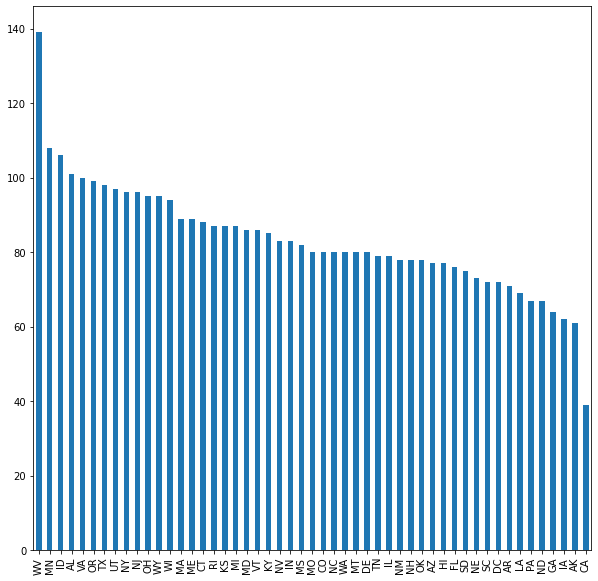

In [14]:
fig = plt.figure(figsize=(10,10))
df['state'].value_counts().plot(kind='bar')

<AxesSubplot:>

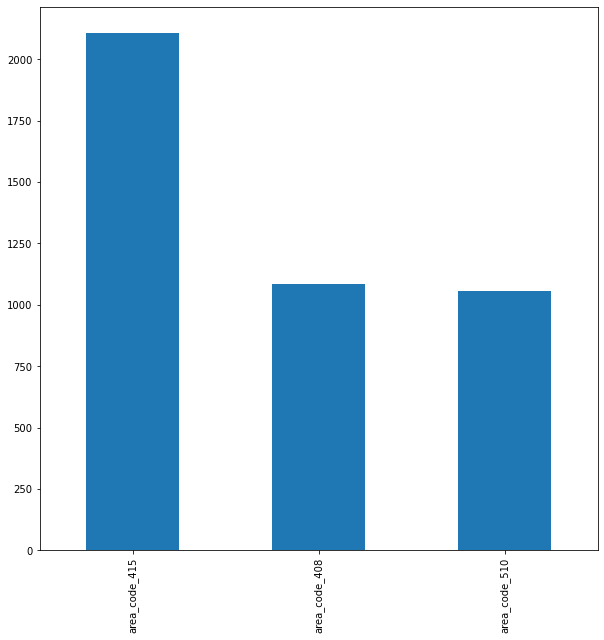

In [15]:
fig = plt.figure(figsize=(10,10))
df['area_code'].value_counts().plot(kind='bar')

# Machine learning models

Drop 100 % correlated features, plus the categorical variable of voice mail subscription was chosen, use number of voice mails instead. Test different models and investigate feature importance later on. While testing models use in the case of logistic regression stanard

In [10]:
df_forVers=df.drop(columns=['voice_mail_plan','total_day_charge','total_eve_charge','state','total_night_charge','total_intl_charge','area_code'])

In [11]:
y=df_forVers['churn']
X_tot=df_forVers.drop(columns=['churn'])
X_tot.head()

,account_length,international_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls
0,107,0,26,161.6,123,195.5,103,254.4,103,13.7,3,1
1,137,0,0,243.4,114,121.2,110,162.6,104,12.2,5,0
2,84,1,0,299.4,71,61.9,88,196.9,89,6.6,7,2
3,75,1,0,166.7,113,148.3,122,186.9,121,10.1,3,3
4,121,0,24,218.2,88,348.5,108,212.6,118,7.5,7,3


In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_tot,y, test_size=0.3, random_state=17)

In [13]:
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier,plot_importance  
from catboost import CatBoostClassifier

"""
rand_params = [
    {
        "clf": [RandomForestClassifier(class_weight="balanced")],
        "clf__n_estimators": list(range(50, 950, 100)),
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 10],
        "clf__min_samples_leaf": [1,3,5,10,20],
        "clf__min_samples_split": [2,5,10,50,200]
    },
    {
        "clf": [LGBMClassifier(class_weight="balanced")],
        "clf__n_estimators": list(range(50, 950, 100)),
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 10],
        "clf__num_leaves": [10,30,50,75],
        "clf__colsample_bytree": [0.6,0.8,1.0],
        "clf__min_child_samples": [5,10,20,30],
        "clf__reg_alpha": [0,0.001,0.01,0.10,1.0,10],
        "clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10]
    },
    {
        "clf": [XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),early_stopping_round=5)],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.03,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 10],
        "clf__min_child_weight": [0,1,3,5,10,20],
        "clf__colsample_bytree": [0.6,0.8,1.0],
        "clf__reg_alpha": [0,0.001,0.01,0.10,1.0,10],
        "clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10],
    },
    {
        "clf": [CatBoostClassifier(auto_class_weights="Balanced")],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.03,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__depth": [None, 1, 2, 5, 7, 10],
        "clf__min_data_in_leaf": [1,2,5,10],
        "clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10],
    }
]
"""

"""
rand_params = [
    {"clf": [KNeighborsClassifier()], "clf__n_neighbors": [3, 5, 7, 10]},
    {"clf": [BernoulliNB()]},
    {"clf": [LinearSVC(class_weight="balanced")], "clf__C": [0.01, 0.1, 1, 5, 10, 100]},
    {#defaults C=1.0,kernel rbf is default, linear could be set here, but done above
        "clf": [SVC()],
        "clf__C": [0.01, 0.1, 1, 5, 10, 100],
        "clf__kernel": ["rbf", "poly"],
        "clf__gamma": ["scale"],
        #only used for poly fit
        "clf__degree": [2,3,4],
        "clf__decision_function_shape": ["ovo"],
        "clf__class_weight": "balanced"
    },
    {
        "clf": [RandomForestClassifier(class_weight="balanced")],
        "clf__n_estimators": list(range(50, 950, 100)),
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 10],
        "clf__min_samples_leaf": [1,3,5,10,20],
        "clf__min_samples_split": [2,5,10,50,200]
    },
    {
        "clf": [LGBMClassifier(class_weight="balanced")],
        "clf__n_estimators": list(range(50, 950, 100)),
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 10],
        "clf__min_samples_leaf": [1,3,5,10,20],
        "clf__min_samples_split": [2,5,10,50,200],
        "clf__reg_alpha": [0,0.001,0.01,0.10,1.0,10],
        "clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10],
        "clf__min_samples_split": [2,5,10,50,200]
    },
    {
        "clf": [XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),early_stopping_round=5)],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.03,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 10],
        "clf__min_child_weight": [0,1,3,5,10,20],
        "clf__colsample_bytree": [0.6,0.8,1.0],
        "clf__reg_alpha": [0,0.001,0.01,0.10,1.0,10],
        "clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10],
    },
    {
        "clf": [CatBoostClassifier(auto_class_weights="Balanced")],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.03,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__depth": [None, 1, 2, 5, 7, 10],
        "clf__min_data_in_leaf": [1,2,5,10],
        "clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10
    },
]
"""
rand_params = [
    {
        "clf": [XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),early_stopping_round=5)],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.01,0.03,0.050,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 8, 10],
        #"clf__min_child_weight": [0,1,3,5,10,20],
        #"clf__colsample_bytree": [0.6,0.8,1.0],
        #"clf__reg_alpha": [0,0.001,0.01,0.10,1.0,10],
        #"clf__reg_lambda": [0,0.001,0.01,0.10,1.0,10],
    },
]

model = KNeighborsClassifier()
model_pipeline = Pipeline([("clf", model)])

rand_cv = RandomizedSearchCV(
    model_pipeline,
    rand_params,
    cv=5,
    n_iter=500,
    scoring=["f1", "accuracy"],
    refit="f1",
    n_jobs=-1,
)

rand_cv.fit(X_train, y_train)

print("Best F1-score", rand_cv.best_score_)
print("Best parameters ", rand_cv.best_params_)
print("training scores", classification_report(y_train, rand_cv.predict(X_train)))
print("testing scores", classification_report(y_test, rand_cv.predict(X_test)))
print("f1 score testing",f1_score(y_test, rand_cv.predict(X_test), average='binary'))

/opt/anaconda3/envs/propulsion/lib/python3.8/site-packages/sklearn/model_selection/_search.py:278: UserWarning: The total space of parameters 315 is smaller than n_iter=500. Running 315 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


[11:44:14] WARNING: /Users/runner/miniforge3/conda-bld/xgboost_1598185652448/work/src/learner.cc:516: 
Parameters: { early_stopping_round } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Best F1-score 0.8504774541202786
Best parameters  {'clf__n_estimators': 550, 'clf__max_depth': None, 'clf__learning_rate': 0.03, 'clf': XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None,
              early_stopping_round=5, gamma=None, gpu_id=None,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.03, max_delta_step=None, max_depth=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=550, n_jobs=None, num_parallel

[0.03494925 0.26690358 0.06956119 0.10268351 0.03364149 0.05912492
 0.03380371 0.03235107 0.03423259 0.06660682 0.05370202 0.21243982]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.92      0.80      0.86       178

    accuracy                           0.96      1275
   macro avg       0.95      0.90      0.92      1275
weighted avg       0.96      0.96      0.96      1275

f1 score testing 0.8588588588588588


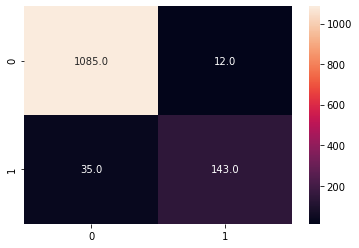

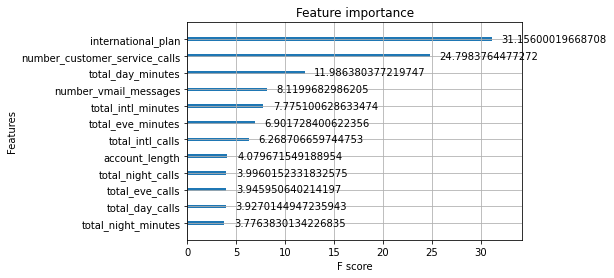

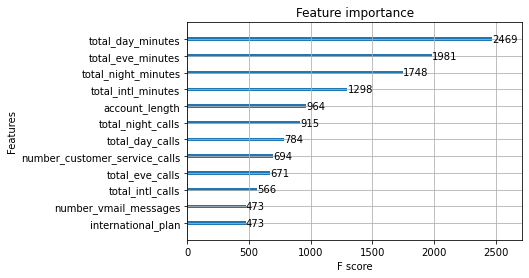

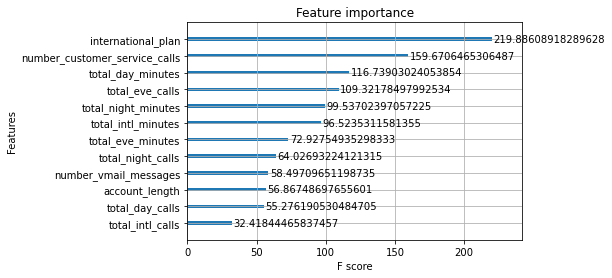

Index(['account_length', 'international_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_eve_minutes',
       'total_eve_calls', 'total_night_minutes', 'total_night_calls',
       'total_intl_minutes', 'total_intl_calls',
       'number_customer_service_calls'],
      dtype='object')
in 0 account_length 0.03494925
in 1 international_plan 0.26690358
in 2 number_vmail_messages 0.06956119
in 3 total_day_minutes 0.102683514
in 4 total_day_calls 0.033641487
in 5 total_eve_minutes 0.059124917
in 6 total_eve_calls 0.03380371
in 7 total_night_minutes 0.032351073
in 8 total_night_calls 0.034232594
in 9 total_intl_minutes 0.06660682
in 10 total_intl_calls 0.053702023
in 11 number_customer_service_calls 0.21243982


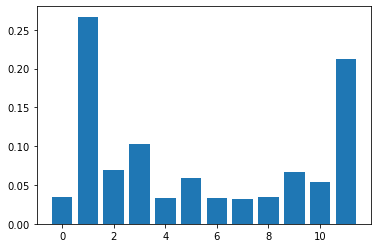

in 0 account_length 0.0016470588235294125
in 1 international_plan 0.05168627450980393
in 2 number_vmail_messages 0.02635294117647058
in 3 total_day_minutes 0.10980392156862746
in 4 total_day_calls 0.002588235294117647
in 5 total_eve_minutes 0.03882352941176469
in 6 total_eve_calls 0.0028235294117647134
in 7 total_night_minutes 0.014117647058823535
in 8 total_night_calls 0.00023529411764704465
in 9 total_intl_minutes 0.023372549019607836
in 10 total_intl_calls 0.021411764705882342
in 11 number_customer_service_calls 0.05694117647058824


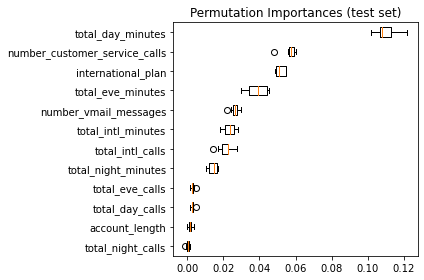

In [48]:
from xgboost import XGBClassifier,plot_importance 
from sklearn.inspection import permutation_importance

clf_xgb = XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),
                       n_estimators=550,max_depth=None,learning_rate=0.03)
clf_xgb.fit(X_train, y_train)

y_test_pred = clf_xgb.predict(X_test)
scores_full=np.mean(cross_val_score(clf_xgb, X_train, y_train, cv=5, scoring='f1'))

conf_matrix= confusion_matrix(y_true=y_test, y_pred=y_test_pred)
sns.heatmap(conf_matrix, annot=True, fmt='.1f')
feat_imp=clf_xgb.feature_importances_
print(clf_xgb.feature_importances_)
print(classification_report(y_true=y_test, y_pred=y_test_pred))
print("f1 score testing",f1_score(y_true=y_test, y_pred=y_test_pred, average='binary'))
plot_importance(clf_xgb,importance_type="gain")
plt.show()
plot_importance(clf_xgb,importance_type="weight")
plt.show()
plot_importance(clf_xgb,importance_type="cover")
plt.show()
print(X_train.columns)
for i in range(0,len(X_train.columns)):
    print("in",i,X_train.columns[i],feat_imp[i])
plt.bar(range(len(clf_xgb.feature_importances_)), clf_xgb.feature_importances_)
plt.show()

perm_result = permutation_importance(clf_xgb, X_test, y_test, n_repeats=10,
                                random_state=42, n_jobs=2)
for i in range(0,len(X_train.columns)):
    print("in",i,X_train.columns[i],perm_result.importances_mean[i])
    
sorted_idx = perm_result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(perm_result.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

12 0.8504774541202786
                          feature  feature_importance
3               total_day_minutes            0.109804
11  number_customer_service_calls            0.056941
1              international_plan            0.051686
5               total_eve_minutes            0.038824
2           number_vmail_messages            0.026353
9              total_intl_minutes            0.023373
10               total_intl_calls            0.021412
7             total_night_minutes            0.014118
6                 total_eve_calls            0.002824
4                 total_day_calls            0.002588
0                  account_length            0.001647
8               total_night_calls            0.000235
check now remaining features 12
12 0.8472306326487946 0.8504774541202786 



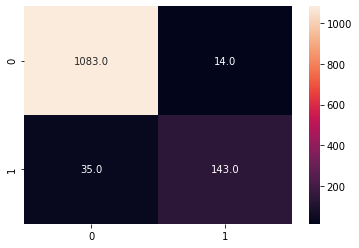

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.91      0.80      0.85       178

    accuracy                           0.96      1275
   macro avg       0.94      0.90      0.92      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 11
11 0.8536499817318232 0.8504774541202786 



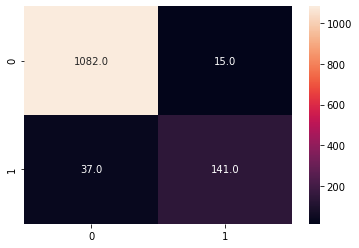

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.90      0.79      0.84       178

    accuracy                           0.96      1275
   macro avg       0.94      0.89      0.91      1275
weighted avg       0.96      0.96      0.96      1275

<bound method IndexOpsMixin.tolist of 0                 total_day_minutes
1     number_customer_service_calls
2                international_plan
3                 total_eve_minutes
4             number_vmail_messages
6                  total_intl_calls
5                total_intl_minutes
7               total_night_minutes
9                   total_eve_calls
8                    account_length
10                  total_day_calls
Name: feature, dtype: object>
check now remaining features 10
10 0.8548924890697688 0.8536499817318232 



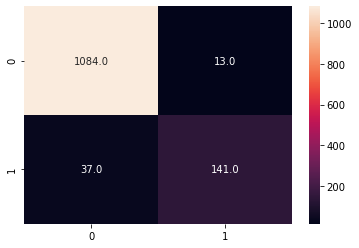

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.92      0.79      0.85       178

    accuracy                           0.96      1275
   macro avg       0.94      0.89      0.91      1275
weighted avg       0.96      0.96      0.96      1275

<bound method IndexOpsMixin.tolist of 0                total_day_minutes
1    number_customer_service_calls
2               international_plan
3                total_eve_minutes
4            number_vmail_messages
6               total_intl_minutes
5                 total_intl_calls
7              total_night_minutes
9                   account_length
8                  total_eve_calls
Name: feature, dtype: object>
check now remaining features 9
9 0.8461080831699835 0.8548924890697688 



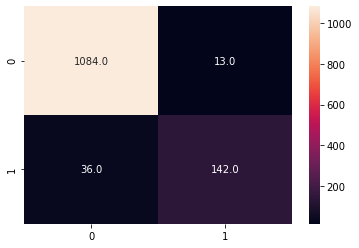

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.92      0.80      0.85       178

    accuracy                           0.96      1275
   macro avg       0.94      0.89      0.92      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 8
8 0.8504131301282994 0.8548924890697688 



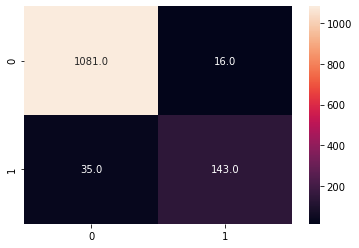

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.90      0.80      0.85       178

    accuracy                           0.96      1275
   macro avg       0.93      0.89      0.91      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 7
7 0.8226535844442022 0.8548924890697688 



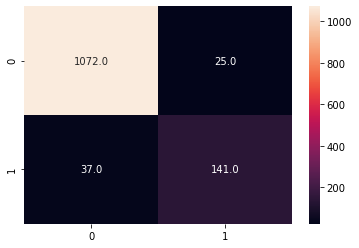

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1097
           1       0.85      0.79      0.82       178

    accuracy                           0.95      1275
   macro avg       0.91      0.88      0.90      1275
weighted avg       0.95      0.95      0.95      1275

check now remaining features 6
6 0.7382367761890185 0.8548924890697688 



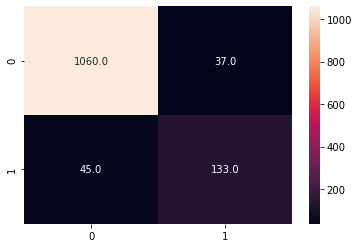

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1097
           1       0.78      0.75      0.76       178

    accuracy                           0.94      1275
   macro avg       0.87      0.86      0.86      1275
weighted avg       0.93      0.94      0.94      1275

check now remaining features 5
5 0.6825868949005146 0.8548924890697688 



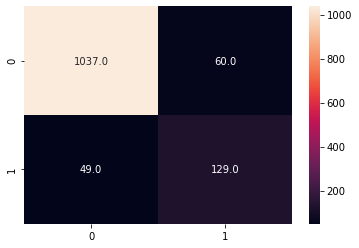

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1097
           1       0.68      0.72      0.70       178

    accuracy                           0.91      1275
   macro avg       0.82      0.84      0.83      1275
weighted avg       0.92      0.91      0.92      1275

0.8548924890697688 10 

                         feature  feature_importance
0              total_day_minutes            0.108078
1  number_customer_service_calls            0.055294
2             international_plan            0.051922
3              total_eve_minutes            0.034745
4          number_vmail_messages            0.025804
6             total_intl_minutes            0.020784
5               total_intl_calls            0.020549
7            total_night_minutes            0.011451
9                 account_length            0.000941
8                total_eve_calls            0.000784 

<bound method IndexOpsMixin.tolist of 0                total_day

In [52]:
scores_best=-1
clf_xgb = XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),
                       n_estimators=550,max_depth=None,learning_rate=0.03)
clf_xgb.fit(X_train, y_train)

perm_result = permutation_importance(clf_xgb, X_test, y_test, n_repeats=10,
                                random_state=42, n_jobs=2)

k_feat=len(perm_result.importances_mean)
list_red_best=[]
scores_best=np.mean(cross_val_score(clf_xgb, X_train, y_train, cv=5, scoring='f1'))
print(k_feat,scores_best)

df_sorted=pd.DataFrame(
    {'feature': df_forVers.drop(columns=['churn']).columns,
     'feature_importance': perm_result.importances_mean
    })
#df_sorted=df_sorted.sort_values(by=["feature_importance"],)
#print(df_sorted.head(15))
df_sorted=df_sorted.sort_values(by=["feature_importance"],ascending=False)
print(df_sorted.head(15))

for k in range(k_feat,4,-1):
    print("check now remaining features",k)
    list_red=df_sorted['feature'][0:k].to_list()
    X_check=X_tot[list_red]
    X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(X_check, y, test_size=0.3, random_state=17)
    clf_xgb.fit(X_c_train, y_c_train)
    pred_xgb_c = clf_xgb.predict(X_c_test)
    scores_c=np.mean(cross_val_score(clf_xgb, X_c_train, y_c_train, cv=5, scoring='f1'))
    print(k,scores_c,scores_best,"\n")
    cf_c = confusion_matrix(y_c_test, pred_xgb_c)
    sns.heatmap(cf_c, annot=True, fmt='.1f')
    plt.show()
    perm_result_c = permutation_importance(clf_xgb, X_c_test, y_c_test, n_repeats=10,
                                random_state=42, n_jobs=2)
    print(classification_report(y_c_test, pred_xgb_c))
    df_features_temp=pd.DataFrame(
    {'feature': df_sorted['feature'][0:k].to_list(),
     'feature_importance': perm_result_c.importances_mean
    })
    df_sorted=df_features_temp.sort_values(by=["feature_importance"],ascending=False)
    if scores_c> scores_best:
        scores_best=scores_c
        k_feat=k
        list_red_best=df_sorted['feature'].to_list
        print (list_red_best)
        df_best=df_sorted
print(scores_best,k_feat,"\n")
print(df_best,"\n")
print(list_red_best,"\n")

12 0.8504774541202786
                          feature  feature_importance
1              international_plan            0.266904
11  number_customer_service_calls            0.212440
3               total_day_minutes            0.102684
2           number_vmail_messages            0.069561
9              total_intl_minutes            0.066607
5               total_eve_minutes            0.059125
10               total_intl_calls            0.053702
0                  account_length            0.034949
8               total_night_calls            0.034233
6                 total_eve_calls            0.033804
4                 total_day_calls            0.033641
7             total_night_minutes            0.032351
check now remaining features 12
12 0.8431564472178137 0.8504774541202786 



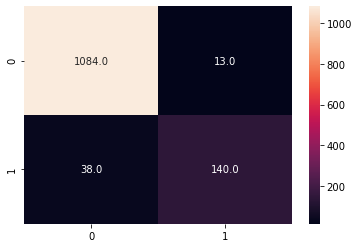

[0.2613554  0.21195886 0.10048022 0.06977008 0.06977495 0.06117454
 0.05313239 0.03524039 0.03296502 0.03378386 0.03580778 0.03455656]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.92      0.79      0.85       178

    accuracy                           0.96      1275
   macro avg       0.94      0.89      0.91      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 11
11 0.8524887737255762 0.8504774541202786 



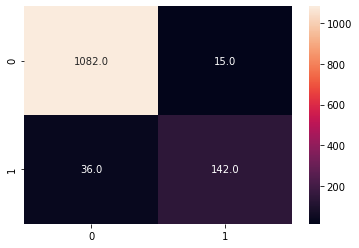

[0.28184953 0.20932814 0.10507154 0.07149021 0.07050955 0.06292426
 0.05565174 0.0363531  0.0346033  0.03700003 0.03521858]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.90      0.80      0.85       178

    accuracy                           0.96      1275
   macro avg       0.94      0.89      0.91      1275
weighted avg       0.96      0.96      0.96      1275

<bound method IndexOpsMixin.tolist of 0                international_plan
1     number_customer_service_calls
2                 total_day_minutes
3                total_intl_minutes
4             number_vmail_messages
5                 total_eve_minutes
6                  total_intl_calls
9               total_night_minutes
7                   total_day_calls
10                  total_eve_calls
8                    account_length
Name: feature, dtype: object>
check now remaining features 10
10 0.8414751567720529 0.8524887737255762 



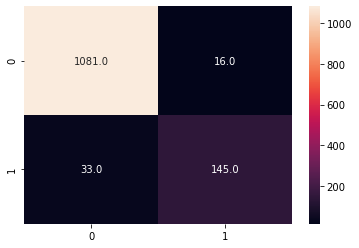

[0.29573855 0.2141247  0.10447872 0.07138442 0.07539098 0.06329178
 0.06239907 0.03860707 0.03647601 0.03810864]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.90      0.81      0.86       178

    accuracy                           0.96      1275
   macro avg       0.94      0.90      0.92      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 9
9 0.8446544380633361 0.8524887737255762 



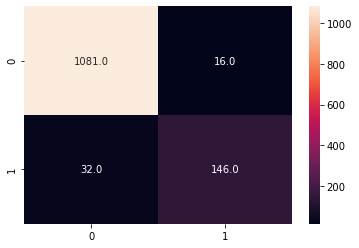

[0.32664886 0.22184466 0.10341386 0.07225438 0.07171506 0.06268643
 0.05898766 0.04253342 0.03991563]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.90      0.82      0.86       178

    accuracy                           0.96      1275
   macro avg       0.94      0.90      0.92      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 8
8 0.8500127633899563 0.8524887737255762 



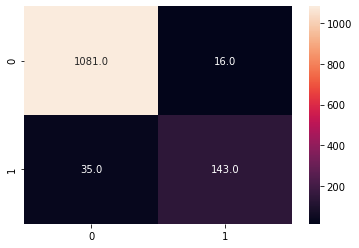

[0.35248953 0.22402495 0.10569547 0.08037475 0.07165623 0.06678199
 0.05311991 0.04585715]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1097
           1       0.90      0.80      0.85       178

    accuracy                           0.96      1275
   macro avg       0.93      0.89      0.91      1275
weighted avg       0.96      0.96      0.96      1275

check now remaining features 7
7 0.8216471924953378 0.8524887737255762 



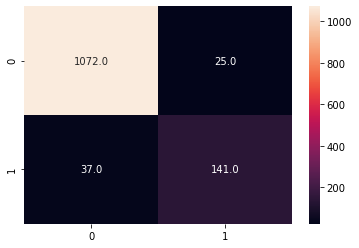

[0.3801614  0.21169679 0.11327605 0.09126938 0.07541443 0.07190613
 0.05627571]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1097
           1       0.85      0.79      0.82       178

    accuracy                           0.95      1275
   macro avg       0.91      0.88      0.90      1275
weighted avg       0.95      0.95      0.95      1275

check now remaining features 6
6 0.7428551694129306 0.8524887737255762 



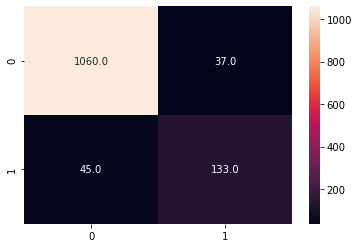

[0.3685049  0.2758358  0.12098985 0.09900013 0.05782073 0.07784853]
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1097
           1       0.78      0.75      0.76       178

    accuracy                           0.94      1275
   macro avg       0.87      0.86      0.86      1275
weighted avg       0.93      0.94      0.94      1275

check now remaining features 5
5 0.6862551402513267 0.8524887737255762 



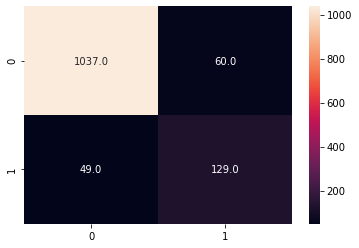

[0.39974186 0.27399868 0.13615762 0.10580154 0.08430033]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1097
           1       0.68      0.72      0.70       178

    accuracy                           0.91      1275
   macro avg       0.82      0.84      0.83      1275
weighted avg       0.92      0.91      0.92      1275

0.8524887737255762 11 

                          feature  feature_importance
0              international_plan            0.281850
1   number_customer_service_calls            0.209328
2               total_day_minutes            0.105072
3              total_intl_minutes            0.071490
4           number_vmail_messages            0.070510
5               total_eve_minutes            0.062924
6                total_intl_calls            0.055652
9             total_night_minutes            0.037000
7                 total_day_calls            0.036353
10                total_eve_calls            0.03521

In [53]:
scores_best=-1

clf_xgb = XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),
                       n_estimators=550,max_depth=None,learning_rate=0.03)
clf_xgb.fit(X_train, y_train)

k_feat=len(clf_xgb.feature_importances_)
list_red_best=[]
scores_best=np.mean(cross_val_score(clf_xgb, X_train, y_train, cv=5, scoring='f1'))
print(k_feat,scores_best)

df_sorted=pd.DataFrame(
    {'feature': df_forVers.drop(columns=['churn']).columns,
     'feature_importance': clf_xgb.feature_importances_
    })
#df_sorted=df_sorted.sort_values(by=["feature_importance"],)
#print(df_sorted.head(15))
df_sorted=df_sorted.sort_values(by=["feature_importance"],ascending=False)
print(df_sorted.head(15))

for k in range(k_feat,4,-1):
    print("check now remaining features",k)
    list_red=df_sorted['feature'][0:k].to_list()
    X_check=X_tot[list_red]
    X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(X_check, y, test_size=0.3, random_state=17)
    clf_xgb.fit(X_c_train, y_c_train)
    pred_xgb_c = clf_xgb.predict(X_c_test)
    scores_c=np.mean(cross_val_score(clf_xgb, X_c_train, y_c_train, cv=5, scoring='f1'))
    print(k,scores_c,scores_best,"\n")
    cf_c = confusion_matrix(y_c_test, pred_xgb_c)
    sns.heatmap(cf_c, annot=True, fmt='.1f')
    plt.show()
    print(clf_xgb.feature_importances_)
    print(classification_report(y_c_test, pred_xgb_c))
    df_features_temp=pd.DataFrame(
    {'feature': df_sorted['feature'][0:k].to_list(),
     'feature_importance': clf_xgb.feature_importances_
    })
    df_sorted=df_features_temp.sort_values(by=["feature_importance"],ascending=False)
    if scores_c> scores_best:
        scores_best=scores_c
        k_feat=k
        list_red_best=df_sorted['feature'].to_list
        print (list_red_best)
        df_best=df_sorted
print(scores_best,k_feat,"\n")
print(df_best,"\n")
print(list_red_best,"\n")

                               Importance
Feature                                  
total_day_minutes                0.109020
number_customer_service_calls    0.050196
international_plan               0.047059
total_eve_minutes                0.036863
number_vmail_messages            0.030588
total_intl_minutes               0.023529
total_intl_calls                 0.023529
total_night_minutes              0.012549
total_day_calls                  0.003137
total_eve_calls                  0.002353
total_night_calls                0.001569
account_length                   0.000784


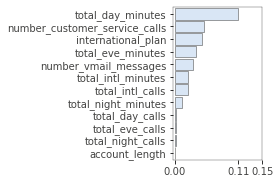

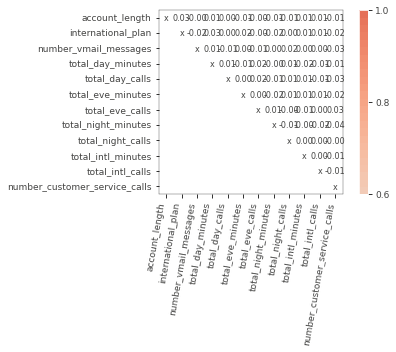

In [56]:
from rfpimp import *

clf_xgb = XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])),
                       n_estimators=550,max_depth=None,learning_rate=0.03)
clf_xgb.fit(X_train, y_train)

imp_ext = importances(clf_xgb, X_test, y_test) # permutation
print(imp_ext)
vis = plot_importances(imp_ext)
vis.view()

vis_v0 = plot_corr_heatmap(X_train, figsize=(7,5))
vis_v0.view()

In [40]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE,ADASYN,SMOTENC
from imblearn.pipeline import Pipeline as IMBPipeline
from skopt import BayesSearchCV


"""
rand_params = [
    {
        "imb": [SMOTE(random_state=42)],
        "imb__k_neighbors": [3,5,7,10]
    },
    {
        "imb": [SMOTENC(random_state=42,categorical_features=[1])],
        "imb__k_neighbors": [3,5,7,10]
    },
    {
        "imb": [ADASYN(random_state=42)],
        "imb__n_neighbors": [3,5,7,10]
    },
    {
        "clf": [XGBClassifier()],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.01,0.03,0.050,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 8, 10],
    },
]
"""
rand_params = [
    {
        "clf": [XGBClassifier(scale_pos_weight=(len(y_train[y_train==0])/len(y_train[y_train==1])))],
        "clf__n_estimators": list(range(50, 950, 100)),
        "clf__learning_rate": [0.001,0.01,0.03,0.050,0.10],
        #expect anything beyond 7 to go wild without regularisation
        "clf__max_depth": [None, 1, 2, 5, 7, 8, 10],
    },
]

model = KNeighborsClassifier()

sc =StandardScaler()

imb = SMOTE(random_state=42)
#imb_model_pipeline = Pipeline([("clf", model)])
imb_model_pipeline = Pipeline([("clf", model)])

bayes_cv = BayesSearchCV(
    imb_model_pipeline,
    rand_params,
    cv=5,
    n_iter=100,
    scoring="f1",
    refit="f1",
    n_jobs=-1,
)

teststh=bayes_cv.fit(X_train, y_train)

print("Best F1-score", bayes_cv.best_score_)
print("Best parameters ", bayes_cv.best_params_)
print("training scores", classification_report(y_train, bayes_cv.predict(X_train)))
print("testing scores", classification_report(y_test, bayes_cv.predict(X_test)))
print("f1 score testing",f1_score(y_test, bayes_cv.predict(X_test), average='binary'))


#print(imb_model_pipeline.get_params().keys())
"""
rand_imb_cv = RandomizedSearchCV(
    imb_model_pipeline,
    rand_params,
    cv=5,
    n_iter=50,
    scoring=["f1", "accuracy"],
    refit="f1",
    n_jobs=-1,
)

rand_imb_cv.fit(X_train, y_train)

print("Best F1-score", rand_imb_cv.best_score_)
print("Best parameters ", rand_imb_cv.best_params_)
print("training scores", classification_report(y_train, rand_imb_cv.predict(X_train)))
print("testing scores", classification_report(y_test, rand_imb_cv.predict(X_test)))
print("f1 score testing",f1_score(y_test, rand_imb_cv.predict(X_test), average='binary'))
"""

/opt/anaconda3/envs/propulsion/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/opt/anaconda3/envs/propulsion/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/opt/anaconda3/envs/propulsion/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/opt/anaconda3/envs/propulsion/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/opt/anaconda3/envs/propulsion/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this p

Best F1-score 0.8504774541202785
Best parameters  OrderedDict([('clf', XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.03, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=550, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=6.083333333333333,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)), ('clf__learning_rate', 0.03), ('clf__max_depth', None), ('clf__n_estimators', 550)])
training scores               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2555
           1       1.00      1.00      1.00       420

    accuracy                           1.00      2975
   

'\nrand_imb_cv = RandomizedSearchCV(\n    imb_model_pipeline,\n    rand_params,\n    cv=5,\n    n_iter=50,\n    scoring=["f1", "accuracy"],\n    refit="f1",\n    n_jobs=-1,\n)\n\nrand_imb_cv.fit(X_train, y_train)\n\nprint("Best F1-score", rand_imb_cv.best_score_)\nprint("Best parameters ", rand_imb_cv.best_params_)\nprint("training scores", classification_report(y_train, rand_imb_cv.predict(X_train)))\nprint("testing scores", classification_report(y_test, rand_imb_cv.predict(X_test)))\nprint("f1 score testing",f1_score(y_test, rand_imb_cv.predict(X_test), average=\'binary\'))\n'